In [124]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.io
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import plotly.graph_objects as go 
import sys
# Adjust the path below to the path of your `module_directory`
sys.path.append('../thesis-2p-behavior-align/')
# Now you can import your module or function
import imaging_behavior_functions
import odor_behavioral_analysis
import scipy.cluster.hierarchy as sch
import glob
from scipy.stats import zscore
from scipy.stats import sem
import mat73
from rastermap import Rastermap, utils
from matplotlib import patches
import matplotlib.cm as cm
from scipy.ndimage import gaussian_filter1d


In [3]:
base_path = "//research.files.med.harvard.edu/neurobio/wilsonlab/Jingxuan/stacks/"
example_path_data = base_path+"20240314-4_MB042B_TOM20GCAMP7f_odor/data/"
example_path_results = base_path+"20240314-4_MB042B_TOM20GCAMP7f_odor/results/"
trial_num = 2
odor_threshold = 5
time_interval_threshold = 16  # Assuming time is in seconds or an equivalent unit
k = 8
window_size = 30

is_mat73, roi_df, dff_raw, kinematics_raw, preprocessed_vars_ds, preprocessed_vars_odor = imaging_behavior_functions.load_intermediate_mat(example_path_data,trial_num)
behav_df = imaging_behavior_functions.make_df_behavior(dff_raw, preprocessed_vars_ds, preprocessed_vars_odor,trial_num,ball_d = 9)
xPos, yPos = imaging_behavior_functions.reconstruct_path(behav_df, ball_d = 9)
roi_names, hdeltab_index, epg_index, hdeltab_sequence, epg_sequence = imaging_behavior_functions.get_roi_seq(roi_df)
dff_all_rois, dff_time = imaging_behavior_functions.load_dff_raw(is_mat73, dff_raw)
neural_df = imaging_behavior_functions.make_df_neural(dff_all_rois, dff_time, roi_names, hdeltab_index, epg_index, hdeltab_sequence, epg_sequence)
behav_df, padded_result_df, smoothed_df = odor_behavioral_analysis.analysis_dfs(behav_df, time_interval_threshold, k, window_size)
combined_df = imaging_behavior_functions.combine_df(behav_df, neural_df)
smoothed_df["translationalV_smoothed"] = np.sqrt(smoothed_df["fwV_smoothed"]**2+smoothed_df["sideV_smoothed"]**2)

In [4]:
selected_df = neural_df.drop(columns=['time'])
selected_df

,PAM_DAN
0,0.052631
1,0.049640
2,0.040797
3,0.032467
4,0.022370
...,...
35526,0.052211
35527,0.060102
35528,0.074862
35529,0.075891


In [5]:
behav_df

,time,fwV,sideV,yawV,heading,abssideV,absyawV,net_motion,net_motion_state,heading_adj,odor,xPos,yPos,cluster_label_temporal,soft_cluster_label_temporal,cluster_label_spatial
0,0.000000,0.000000,0.000000,0.000000,1.593341,0.000000,0.000000,0.000000,0,1.593341,-0.000000,0.000000,0.000000,0,0,0
1,0.017168,3.585279,-3.959612,-0.737886,1.590616,3.959612,0.737886,8.282777,1,1.590616,-0.000000,-0.003933,0.057768,0,0,0
2,0.034337,5.139794,-3.848696,-1.245503,1.584543,3.848696,1.245503,10.233994,1,1.584543,-0.000000,-0.008346,0.142305,0,0,0
3,0.051505,5.896064,-1.418253,-1.718474,1.575840,1.418253,1.718474,9.032791,1,1.575840,-0.000000,-0.011446,0.242140,0,0,0
4,0.068674,6.183029,1.866607,-2.138585,1.566291,1.866607,2.138585,10.188220,1,1.566291,-0.000000,-0.012586,0.350082,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35526,609.927154,11.112203,-19.567536,-0.722879,5.170355,19.567536,0.722879,31.402618,1,-26.245572,-0.000000,440.098672,1746.352152,0,8,0
35527,609.944323,10.610684,-16.479890,-0.829286,5.164776,16.479890,0.829286,27.919861,1,-26.251150,-0.000000,440.043589,1746.194291,0,8,0
35528,609.961491,9.204000,-11.966981,-0.738380,5.158288,11.966981,0.738380,21.909361,1,-26.257638,-0.000000,439.993761,1746.055938,0,8,0
35529,609.978660,7.234617,-7.143962,-0.461857,5.158567,7.143962,0.461857,14.840436,1,-26.257359,-0.000000,439.951712,1745.946120,0,8,0


In [6]:
base_dir = '//research.files.med.harvard.edu/neurobio/wilsonlab/Jingxuan/stacks/20240314-4_MB042B_TOM20GCAMP7f_odor/E_05_Iter_10080/suite2p/plane0'
F = np.load(base_dir+'/F.npy', allow_pickle=True)
Fneu = np.load(base_dir+'/Fneu.npy', allow_pickle=True)
spks = np.load(base_dir+'/spks.npy', allow_pickle=True)
stat = np.load(base_dir+'/stat.npy', allow_pickle=True)
ops =  np.load(base_dir+'/ops.npy', allow_pickle=True)
ops = ops.item()
iscell = np.load(base_dir+'/iscell.npy', allow_pickle=True)

In [7]:
F_cell = F[(iscell[:,0]==1),:]
spks_cell = spks[(iscell[:,0]==1),:]
Fneu_cell = Fneu[(iscell[:,0]==1),:]
stat_cell = stat[(iscell[:,0]==1)]

In [8]:
n_components=100
def perform_pca(selected_df, n_components):
    """
    Perform PCA on the given dataframe.

    Args:
    - data (pd.DataFrame): The dataframe containing neuron activity data.
    - n_components (int): The number of principal components to compute.

    Returns:
    - pca (PCA object): The PCA object after fitting the data.
    - transformed_data (np.array): Data transformed into principal components.
    - explained_variance_ratio (np.array): The amount of variance explained by each of the selected components.
    """
    # Standardize the data (important for PCA)
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(selected_df)

    # Perform PCA
    pca = PCA(n_components=n_components)
    transformed_data = pca.fit_transform(scaled_data)
    explained_variance_ratio = pca.explained_variance_ratio_

    return pca, transformed_data, explained_variance_ratio
pca, transformed_data, explained_variance_ratio = perform_pca(F_cell.T,n_components)

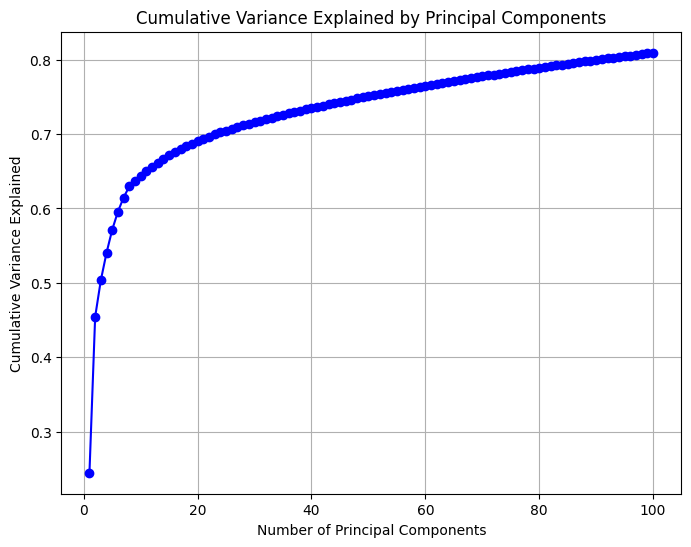

In [9]:
# Calculate cumulative variance explained
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

# Plot cumulative variance explained
plt.figure(figsize=(8, 6))
plt.plot(np.arange(1, n_components + 1), cumulative_variance, marker='o', linestyle='-', color='b')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Variance Explained')
plt.title('Cumulative Variance Explained by Principal Components')
plt.grid(True)
plt.show()

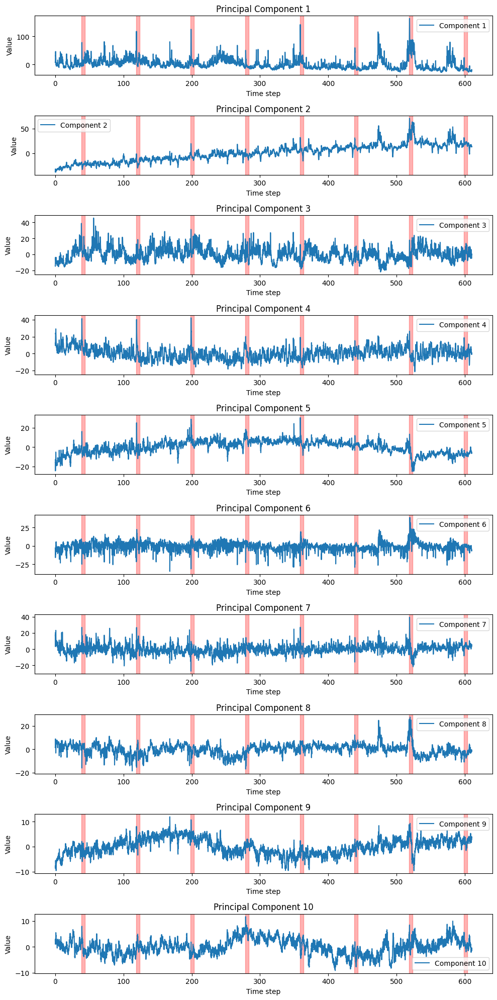

In [10]:
# visualze top PCstime_steps = range(transformed_data.shape[0])

n_components = 10
time_steps = range(transformed_data.shape[0])
# Check if 'odor' column exists and shade where odor > 5
if 'odor' in behav_df.columns:
    odor_mask = behav_df['odor'] > 5

# Create a figure with subplots
fig, axes = plt.subplots(n_components, 1, figsize=(10, 2*n_components))

for i in range(n_components):
    ax = axes[i]
    ax.plot(neural_df.time, transformed_data[:, i], label=f'Component {i+1}')
    ax.set_title(f'Principal Component {i+1}')
    ax.set_xlabel('Time step')
    ax.set_ylabel('Value')
    ax.legend()
    # Apply shading to all subplots
    ax.fill_between(behav_df['time'], ax.get_ylim()[0], ax.get_ylim()[1], where=odor_mask, color='red', alpha=0.3, transform=ax.get_xaxis_transform())
    

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()

In [11]:
# Extract the first three PCs
pc1 = transformed_data[:, 0]
pc2 = transformed_data[:, 1]
pc3 = transformed_data[:, 2]

# Time steps for coloring
#phase = np.array(param_df.phase)
#heading = 2*np.pi - np.array(behav_df.heading)
x_pos = np.array([stat[i]['med'][0] for i in range(len(stat))])
x_pos_cell = x_pos[(iscell[:,0]==1)]
y_pos = np.array([stat[i]['med'][1] for i in range(len(stat))])
y_pos_cell = y_pos[(iscell[:,0]==1)]
heading = 2*np.pi-behav_df.heading
odor = behav_df.odor

# Create the figure
fig = go.Figure(data=[go.Scatter3d(
    x=pc1,
    y=pc2,
    z=pc3,
    mode='markers',
    marker=dict(
        size=5,
        color=odor, 
        colorscale='Viridis',  # Choose a color scale
        colorbar=dict(title='y position'),
        opacity=0.8
    )
)])

# Set the layout of the figure
fig.update_layout(
    title='Trajectory of the First 3 Principal Components in State Space',
    scene=dict(
        xaxis_title='PC1',
        yaxis_title='PC2',
        zaxis_title='PC3'
    ),
    margin=dict(l=0, r=0, b=0, t=30)
)

# Show the figure
fig.show()


<Axes: >

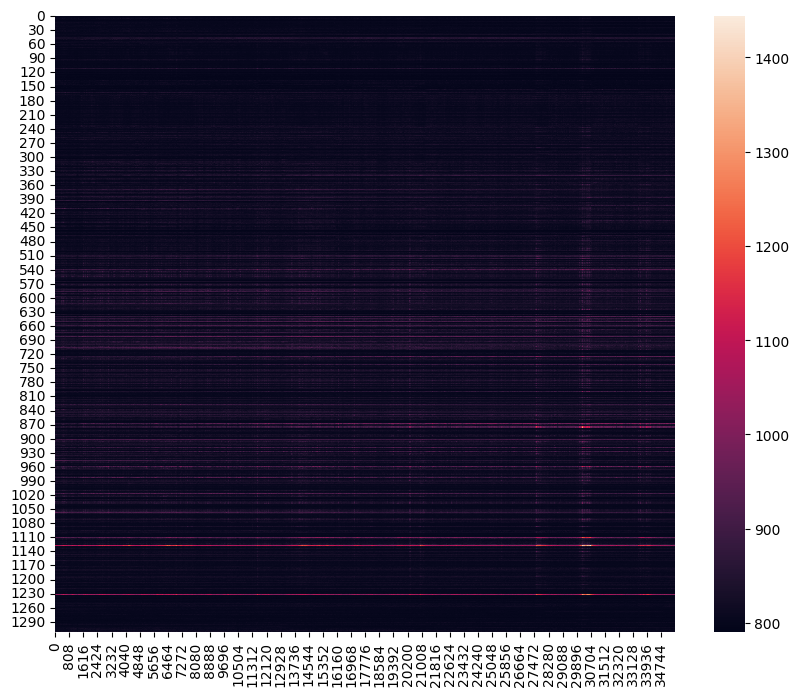

In [12]:
fig, ax = plt.subplots(figsize=(10,8))
sort_id_x = np.argsort(x_pos_cell)
sort_id_y = np.argsort(y_pos_cell)
sns.heatmap(F_cell[sort_id_y])

In [13]:
def dfoverf(F):
    # Determine F_0 using the 5th percentile of the fluorescence data
    F_0 = np.percentile(F, 5, axis=1)

    # Calculate ΔF/F
    deltaF_over_F = (F - F_0[:, np.newaxis]) / F_0[:, np.newaxis]
    return deltaF_over_F
dF_cell = dfoverf(F_cell)

<Axes: >

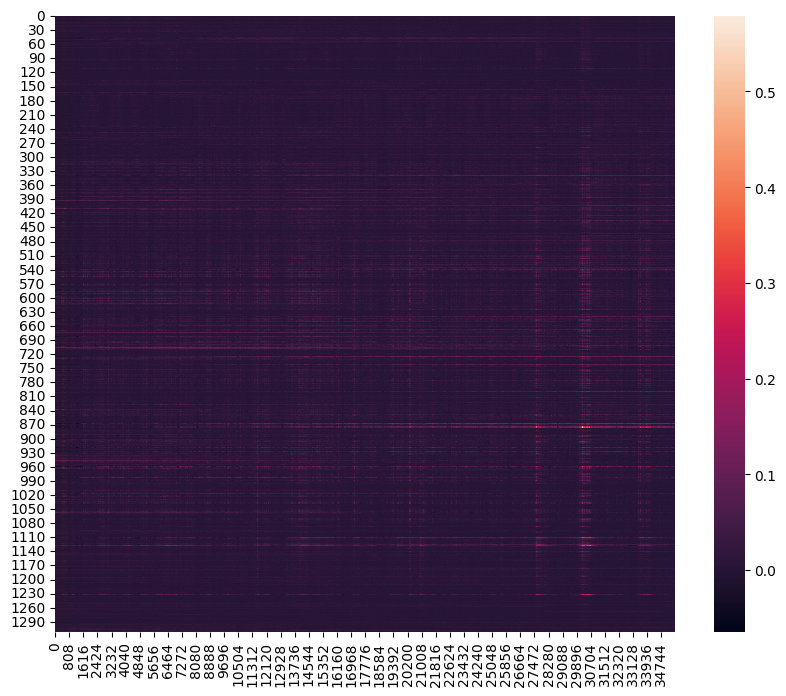

In [14]:
fig, ax = plt.subplots(figsize=(10,8))
sort_id_x = np.argsort(x_pos_cell)
sort_id_y = np.argsort(y_pos_cell)
sns.heatmap(dF_cell[sort_id_y])

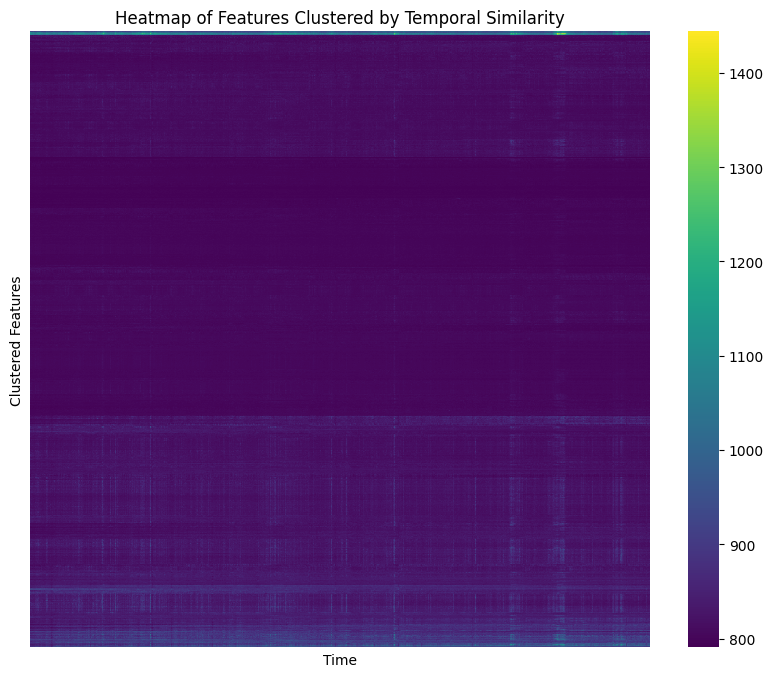

In [15]:
def hierachical_cluster(matrix, method='average', metric='euclidean'):
    """
    Clusters a matrix on the feature dimension based on temporal similarity and plots a heatmap.
    
    Parameters:
    - matrix: A 2D NumPy array with shape (features, time).
    - method: Method of clustering ('average', 'single', 'complete', etc.).
    - metric: Distance metric for clustering ('euclidean', 'cosine', etc.).
    """
    
    # Perform hierarchical clustering on the features
    Y = sch.linkage(matrix, method=method, metric=metric)
    Z = sch.dendrogram(Y, orientation='right', no_plot=True)  # 'no_plot=True' to not plot the dendrogram
    
    # Reorder the matrix according to the clustering
    index = Z['leaves']
    matrix_clustered = matrix[index, :]
    # Create a heatmap of the clustered matrix
    fig, ax = plt.subplots(figsize=(10,8))
    sns.heatmap(matrix_clustered, cmap='viridis', xticklabels=False, yticklabels=False)
    ax.set_title('Heatmap of Features Clustered by Temporal Similarity')
    ax.set_xlabel('Time')
    ax.set_ylabel('Clustered Features')
    plt.show()
    return Y, matrix_clustered

Y, F_cell_clus = hierachical_cluster(F_cell, method='average', metric='euclidean')

In [16]:
def cluster_dict_n(Y,last_x_step):
    # Initialize cluster labels for each original observation
    n = Y.shape[0] + 1  # Number of original observations
    cluster_labels = {i: [i] for i in range(n)}

    # Iterate over the linkage matrix
    for i, row in enumerate(Y[:n-1-last_x_step,:]):
        new_cluster_idx = n + i  # Index of the new cluster being formed
        cluster_i, cluster_j = int(row[0]), int(row[1])  # Clusters/observations being merged
        
        # Combine the labels from the clusters being merged into the new cluster
        cluster_labels[new_cluster_idx] = cluster_labels.pop(cluster_i) + cluster_labels.pop(cluster_j)
        
        # Optionally, print or store this information
        print(f"Step {i+1}: Merge clusters {cluster_i} and {cluster_j} into new cluster {new_cluster_idx}.")
    return cluster_labels
    # At this point, `cluster_labels` contains the labels for each step of the clustering

cluster_labels = cluster_dict_n(Y,4)


Step 1: Merge clusters 439 and 993 into new cluster 1312.
Step 2: Merge clusters 1081 and 1226 into new cluster 1313.
Step 3: Merge clusters 1280 and 1303 into new cluster 1314.
Step 4: Merge clusters 1252 and 1276 into new cluster 1315.
Step 5: Merge clusters 1005 and 1286 into new cluster 1316.
Step 6: Merge clusters 1156 and 1223 into new cluster 1317.
Step 7: Merge clusters 1189 and 1256 into new cluster 1318.
Step 8: Merge clusters 1239 and 1296 into new cluster 1319.
Step 9: Merge clusters 1306 and 1313 into new cluster 1320.
Step 10: Merge clusters 1179 and 1275 into new cluster 1321.
Step 11: Merge clusters 1211 and 1235 into new cluster 1322.
Step 12: Merge clusters 1257 and 1283 into new cluster 1323.
Step 13: Merge clusters 819 and 1272 into new cluster 1324.
Step 14: Merge clusters 1072 and 1177 into new cluster 1325.
Step 15: Merge clusters 1261 and 1290 into new cluster 1326.
Step 16: Merge clusters 1243 and 1246 into new cluster 1327.
Step 17: Merge clusters 1255 and 131

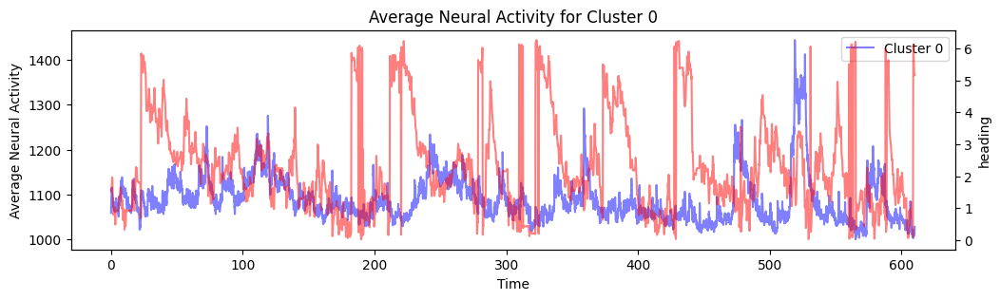

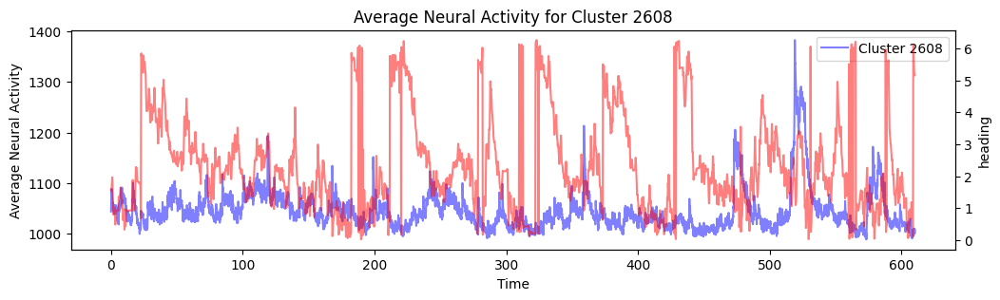

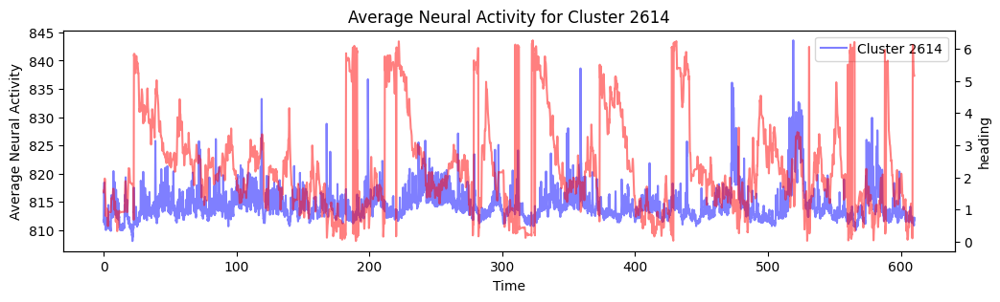

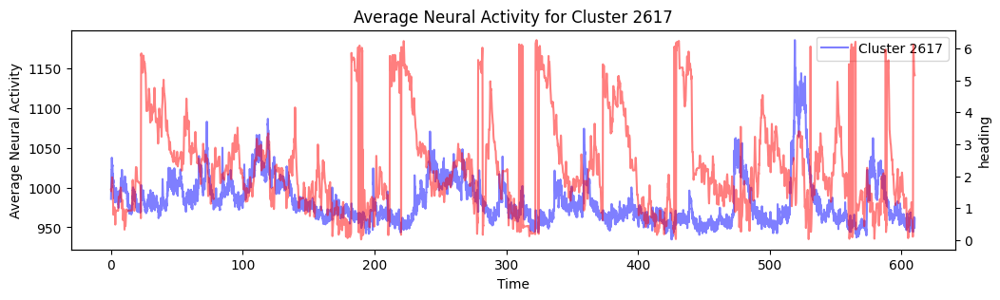

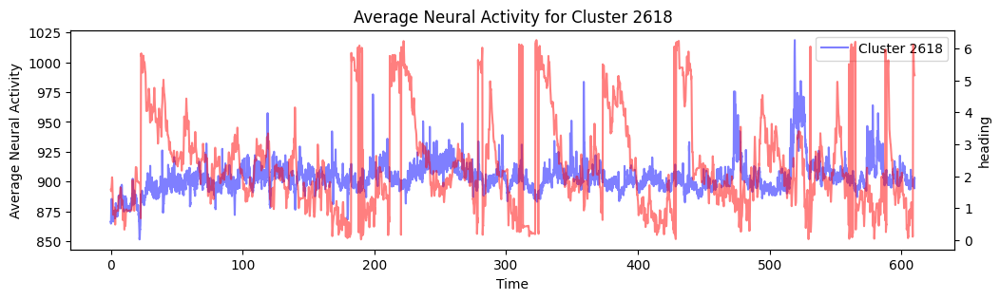

In [17]:
def plot_avg(F, cluster_labels, behav_df, ref_kw):
    for cluster_idx, roi_indices in cluster_labels.items():
        # Extract activities for the current cluster
        cluster_activities = F[roi_indices, :]
        
        # Compute the average activity over time for the cluster
        avg_activity = np.mean(cluster_activities, axis=0)
        
        # Plot the average activity
        fig, ax = plt.subplots(figsize=(12, 3))
        ax.plot(behav_df.time, avg_activity, label=f'Cluster {cluster_idx}',color = 'blue',alpha=0.5)
        ax2 = ax.twinx()
        ax2.plot(behav_df.time, imaging_behavior_functions.apply_gaussian_smoothing(behav_df[ref_kw],3),color = 'red', alpha=0.5)
        ax2.set_ylabel(ref_kw)
        ax.set_xlabel('Time')
        ax.set_ylabel('Average Neural Activity')
        ax.set_title(f'Average Neural Activity for Cluster {cluster_idx}')
        ax.legend()
        plt.show()

plot_avg(F_cell, cluster_labels, behav_df, 'heading')

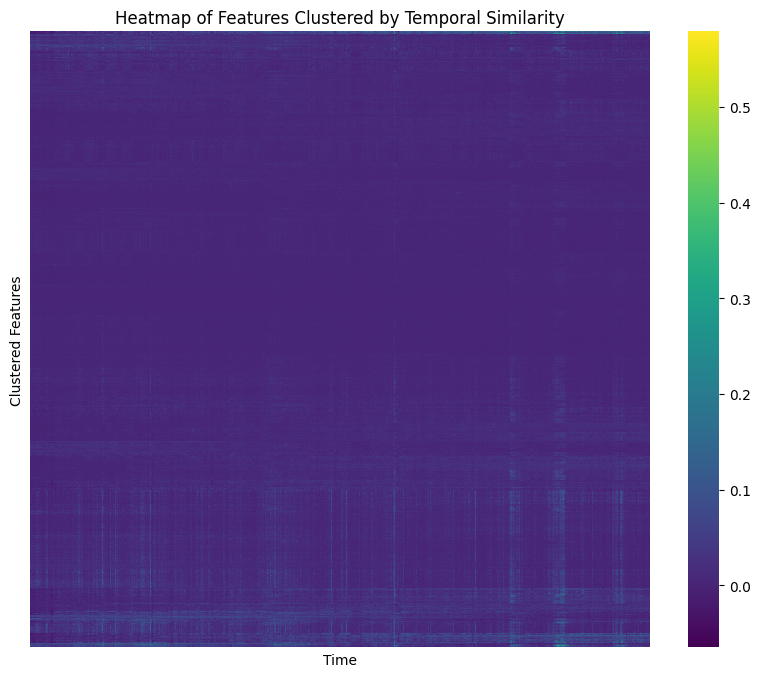

In [18]:
Y_dF, dF_cell_clus = hierachical_cluster(dF_cell, method='average', metric='euclidean')

Step 1: Merge clusters 439 and 1005 into new cluster 1312.
Step 2: Merge clusters 1257 and 1311 into new cluster 1313.
Step 3: Merge clusters 1255 and 1306 into new cluster 1314.
Step 4: Merge clusters 1239 and 1296 into new cluster 1315.
Step 5: Merge clusters 1153 and 1203 into new cluster 1316.
Step 6: Merge clusters 1277 and 1312 into new cluster 1317.
Step 7: Merge clusters 1252 and 1276 into new cluster 1318.
Step 8: Merge clusters 1081 and 1226 into new cluster 1319.
Step 9: Merge clusters 1235 and 1275 into new cluster 1320.
Step 10: Merge clusters 1314 and 1317 into new cluster 1321.
Step 11: Merge clusters 1209 and 1269 into new cluster 1322.
Step 12: Merge clusters 819 and 1193 into new cluster 1323.
Step 13: Merge clusters 1280 and 1303 into new cluster 1324.
Step 14: Merge clusters 1229 and 1288 into new cluster 1325.
Step 15: Merge clusters 993 and 1321 into new cluster 1326.
Step 16: Merge clusters 1191 and 1246 into new cluster 1327.
Step 17: Merge clusters 1284 and 129

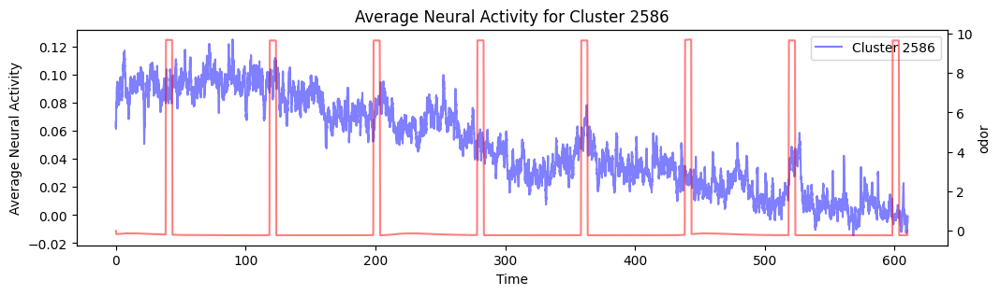

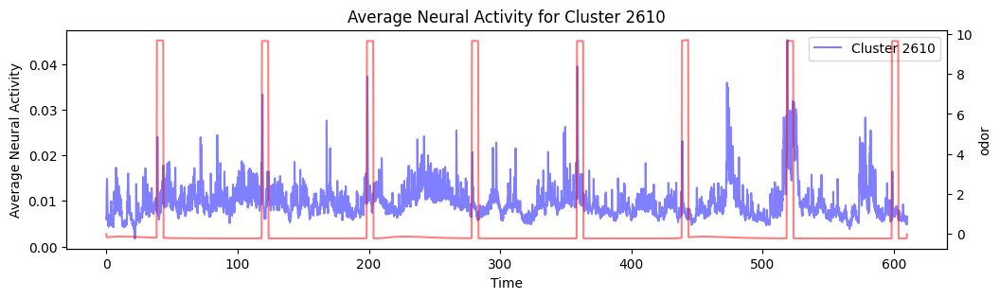

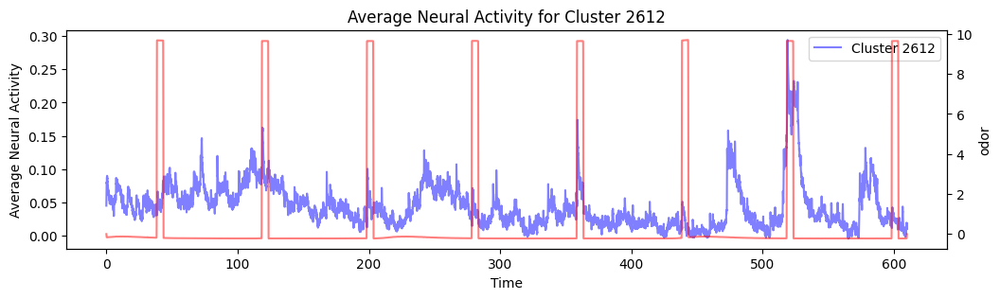

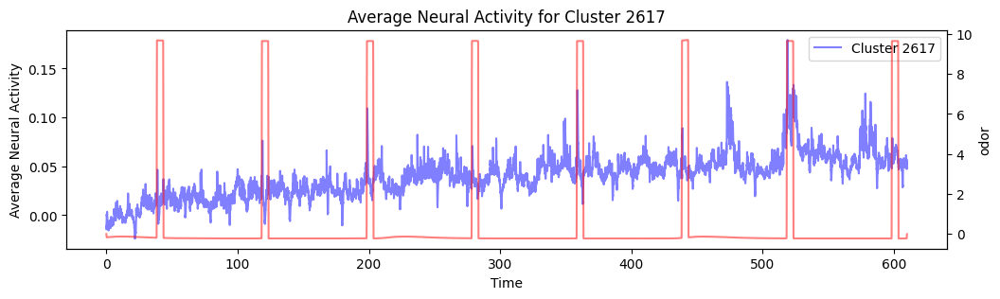

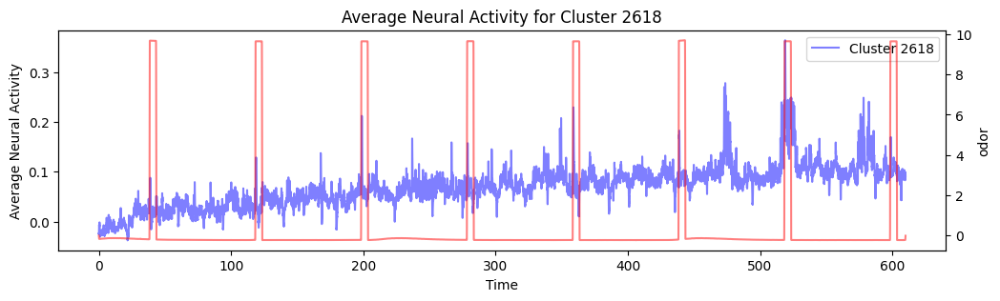

In [19]:
cluster_labels = cluster_dict_n(Y_dF,4)
plot_avg(dF_cell, cluster_labels, behav_df, 'odor')

## Rastermap

In [20]:
# load appropriate activity 
activity_mode = 0
if activity_mode == 0:
    fl_cell = F_cell
elif activity_mode == 1:
    fl_cell = Fneu_cell
elif activity_mode == 2:
    fl_cell = F_cell - 0.7 * Fneu_cell
else:
    fl_cell = dF_cell

In [21]:
fl_cell = zscore(fl_cell, axis=1)
fl_cell_norm = np.maximum(-4, np.minimum(8, fl_cell)) + 4
fl_cell_norm /= 12

In [78]:
model = Rastermap(n_clusters=16, # number of clusters to compute
                  n_PCs=160, # number of PCs to use
                  locality=0.75, # locality in sorting to find sequences (this is a value from 0-1)
                  time_lag_window=5, # use future timepoints to compute correlation
                  grid_upsample=10, # default value, 10 is good for large recordings
                  ).fit(fl_cell_norm)
y = model.embedding # neurons x 1
isort = model.isort

normalizing data across axis=1
projecting out mean along axis=0
data normalized, 0.57sec
sorting activity: 1312 valid samples by 35531 timepoints
n_PCs = 160 computed, 3.35sec


c:\Users\wilson\anaconda3\envs\suite2p\lib\site-packages\rastermap\cluster.py:139: UserWarning:

found fewer than half the n_clusters that the user specified, rerunning with random initialization



16 clusters computed, time 3.59sec
clusters sorted, time 3.66sec
clusters upsampled, time 3.69sec
rastermap complete, time 3.78sec


In [79]:
model.__dict__

{'n_clusters': 16,
 'n_PCs': 160,
 'time_lag_window': 5,
 'locality': 0.75,
 'grid_upsample': 10,
 'time_bin': 0,
 'normalize': True,
 'mean_time': True,
 'n_splits': 0,
 'run_scaled_kmeans': True,
 'verbose': True,
 'verbose_sorting': False,
 'keep_norm_X': True,
 'bin_size': 0,
 'symmetric': False,
 'sticky': True,
 'nc_splits': None,
 'smoothness': 1,
 'sorting_algorithm': 'travelling_salesman',
 'X': array([[-1.0576689e-01,  3.5215914e-02, -6.3670874e-03, ...,
         -4.6748394e-01, -5.9459305e-01, -3.7608433e-01],
        [-1.9749773e+00, -1.8976521e+00, -2.0183270e+00, ...,
          8.3908862e-01,  8.0535704e-01,  7.4655426e-01],
        [-8.2586169e-02, -2.0455360e-02, -1.1683115e-01, ...,
         -1.7983377e-01, -3.3640260e-01, -2.2322553e-01],
        ...,
        [ 2.3746955e+00,  1.7020264e+00,  1.3029352e+00, ...,
         -5.2464938e-01, -3.9896339e-01, -1.9249469e-03],
        [-1.5217952e+00, -1.6001935e+00, -1.8642850e+00, ...,
          1.5459270e+00,  1.6364487e+0

In [80]:
n_neurons, n_time = fl_cell.shape
nbin = 1 # number of neurons to bin over
ndiv = (n_neurons//nbin) * nbin
# group sorted matrix into rows of length nbin
sn = fl_cell[isort][:ndiv].reshape(ndiv//nbin, nbin, -1)
# take mean over neurons in a bin
sn = sn.mean(axis=1)

(-0.5, 0.5, 1311.5, -0.5)

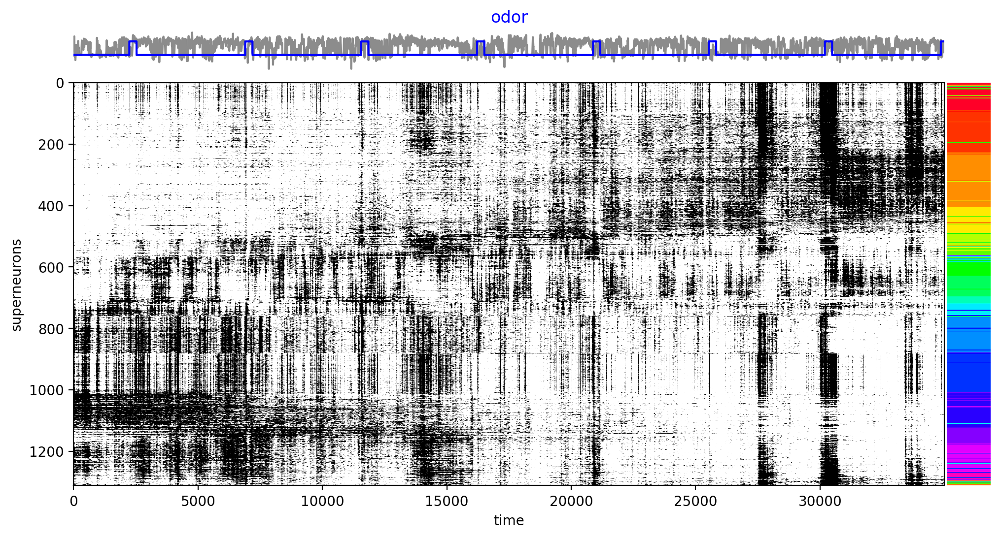

In [81]:
# timepoints to visualize
xmin = 0
xmax = xmin + 35000

# make figure with grid for easy plotting
fig = plt.figure(figsize=(12,6), dpi=200)
grid = plt.GridSpec(9, 20, figure=fig, wspace = 0.05, hspace = 0.3)

# colors for the behaviors
kp_colors = np.array([[0.55,0.55,0.55], [0.,0.,1],
                      [0.8,0,0], [1.,0.4,0.2],
                      [0,0.6,0.4], [0.2,1,0.5],
                      ])

# plot running speed
ax = plt.subplot(grid[0, :-1])
ax.plot(smoothed_df.fwV_smoothed[xmin:xmax], color=kp_colors[0])
ax.set_xlim([0, xmax-xmin])
ax.axis("off")
ax.set_title("forward speed", color=kp_colors[0])

# plot behavior
ax = plt.subplot(grid[0, :-1])
ax.plot(np.array(behav_df.odor[xmin:xmax]), color=kp_colors[1])
ax.set_xlim([0, xmax-xmin])
ax.axis("off")
ax.set_title("odor", color=kp_colors[1])


# plot superneuron activity
ax = plt.subplot(grid[1:, :-1])
ax.imshow(sn[:, xmin:xmax], cmap="gray_r", vmin=0, vmax=0.8, aspect="auto")
ax.set_xlabel("time")
ax.set_ylabel("superneurons")

ax = plt.subplot(grid[1:, -1])
ax.imshow(model.embedding_clust[isort][:,np.newaxis], cmap="gist_rainbow", aspect="auto")
ax.axis("off")



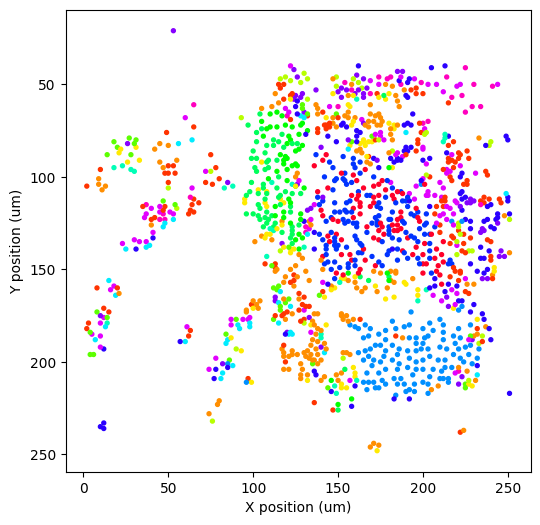

In [82]:
# POSITIONS OF ALL NEURONS
plt.figure(figsize=(6,6))
plt.scatter(y_pos_cell, x_pos_cell, s = 8, c=model.embedding_clust, cmap="gist_rainbow")
plt.xlabel('X position (um)')
plt.ylabel('Y position (um)')
plt.gca().invert_yaxis()
#plt.axis("square")

In [83]:
unique_val, unqiue_counts = np.unique(model.embedding_clust,return_counts=True)
print(unqiue_counts)

[ 87 152 178  80  39  39  54  69  25  37 116 130 115  59 101  31]


In [84]:
unique_val

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15],
      dtype=int64)

C:\Users\wilson\AppData\Local\Temp\ipykernel_11280\1819136923.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



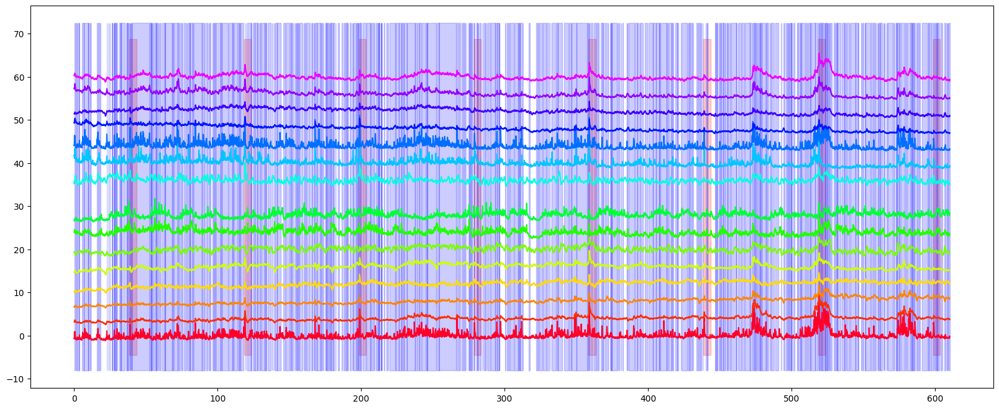

In [87]:
x_bins = unique_val[unqiue_counts>30]
# Get the gist_rainbow colormap
cmap = cm.get_cmap('gist_rainbow')
fig, ax = plt.subplots(figsize=(20,8))
y_offset = 4
for clus_index in x_bins:
    clus_ts = fl_cell[model.embedding_clust == clus_index]
    color = cmap(clus_index / len(unique_val))
    ax.plot(behav_df.time,np.mean(clus_ts,axis=0)+ (clus_index * y_offset),color=color)
ax.fill_between(behav_df.time, ax.get_ylim()[0], ax.get_ylim()[1], where=odor_mask, color='red', alpha=0.2)
motion_mask = (behav_df.fwV >= 4)
#heading_mask = 
ax.fill_between(behav_df.time, ax.get_ylim()[0], ax.get_ylim()[1], where=motion_mask, color='blue', alpha=0.2)


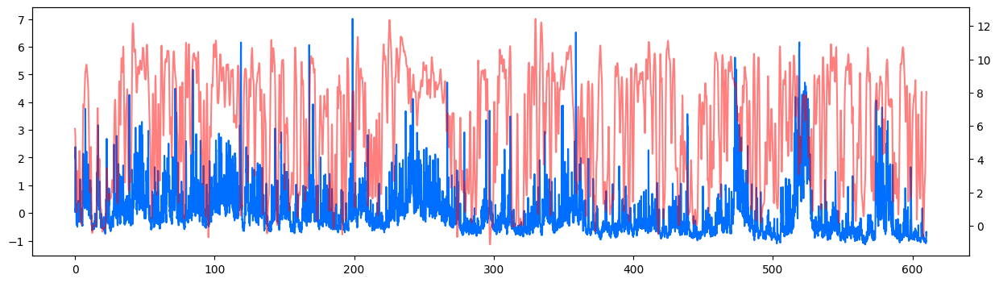

In [134]:
fig, ax = plt.subplots(figsize=(15,4))
clus_10 = fl_cell[model.embedding_clust == 10]
clus_11 = fl_cell[model.embedding_clust == 11]
#ax.plot(behav_df.time, np.mean(clus_10,axis=0),color = cmap(10/len(unique_val)))
ax.plot(behav_df.time, np.mean(clus_11,axis=0),color = cmap(11/len(unique_val)))
ax2 = ax.twinx()
ax2.plot(behav_df.time, gaussian_filter1d(behav_df.fwV,20),'red',alpha=0.5)

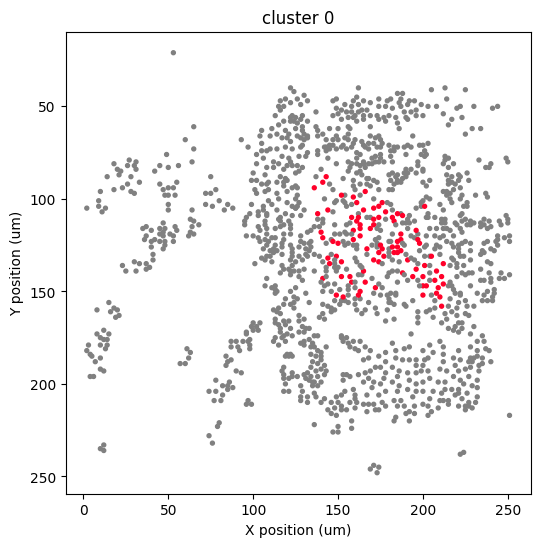

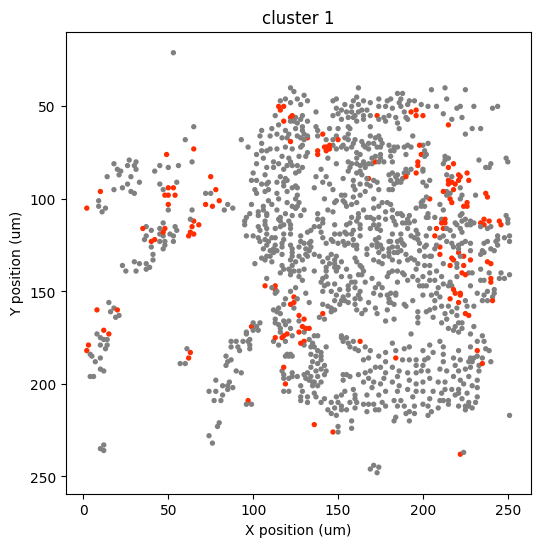

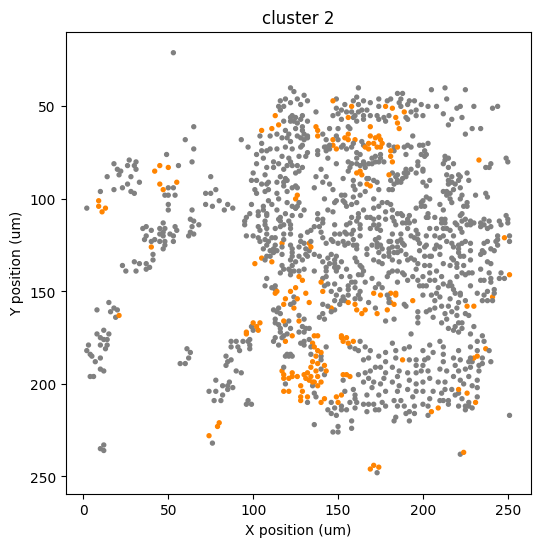

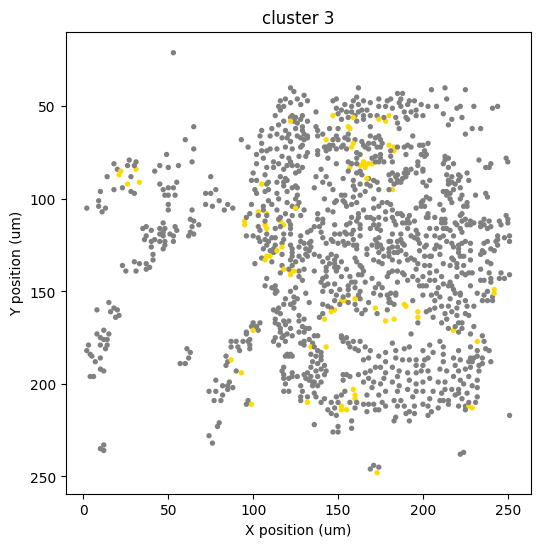

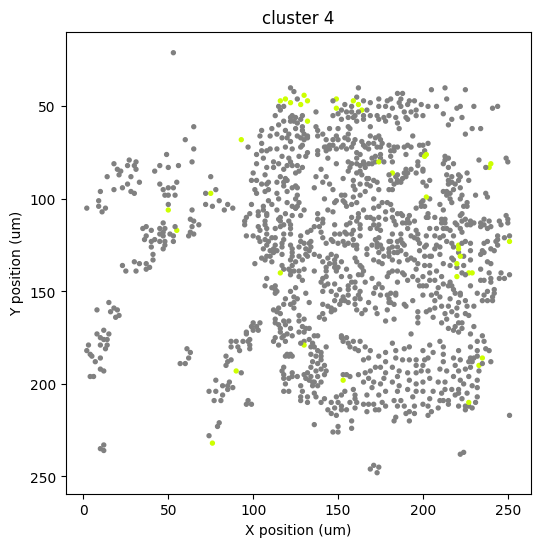

...

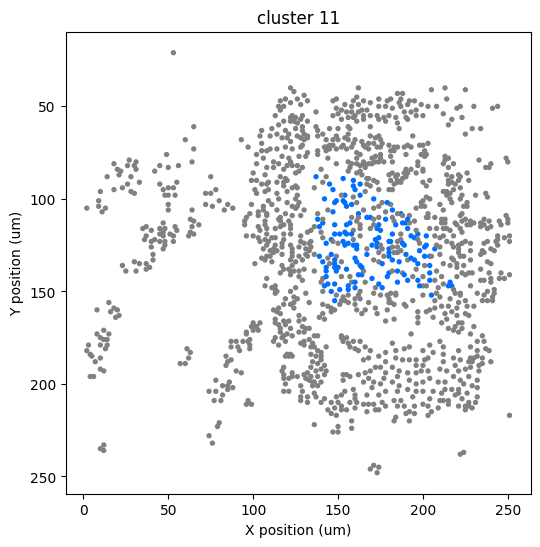

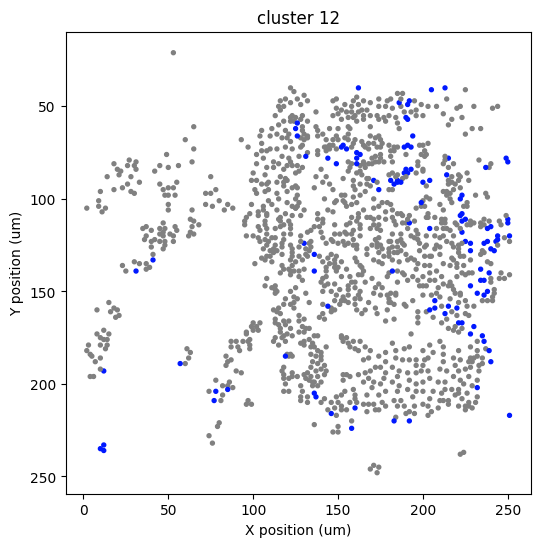

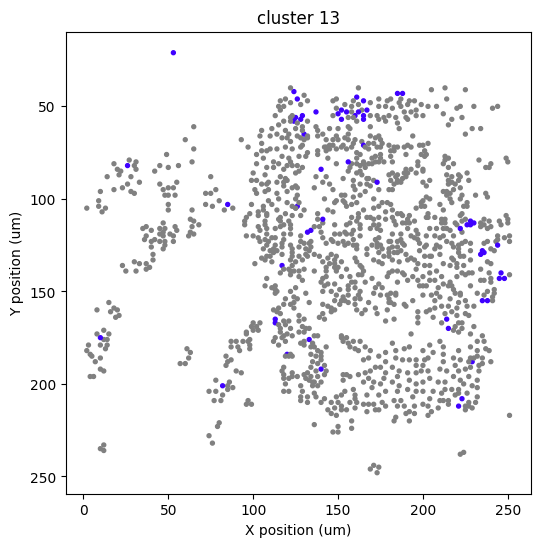

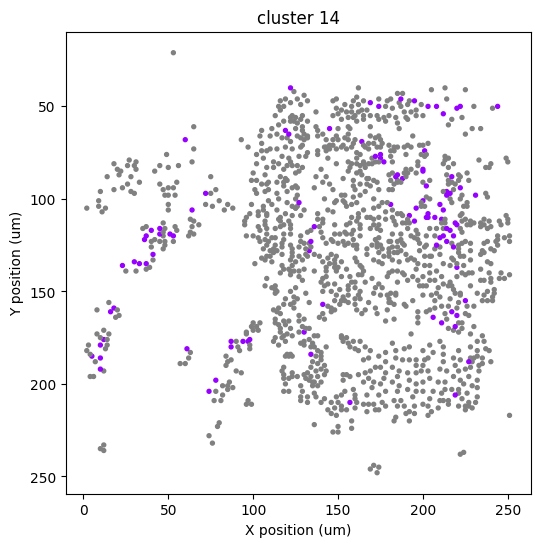

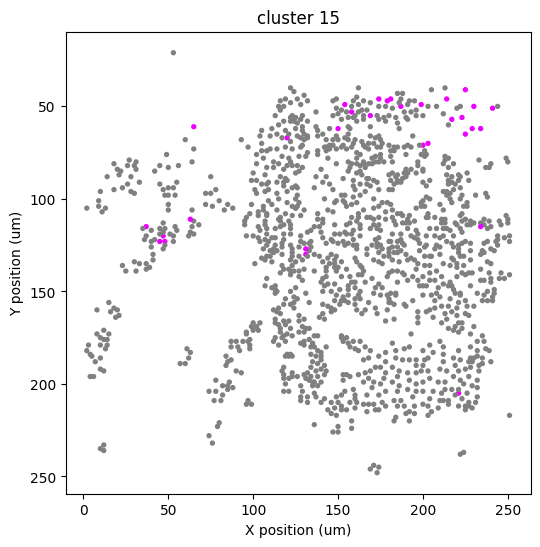

In [91]:
# Assuming cell_classes contains the class for each cell and class_of_interest is the one you want to highlight
def highlight_class(bin_index, mapped_embeddings,highlight_color):
    class_of_interest = bin_index  # Replace 'YourClassHere' with the actual class of interest
    #highlight_color = 'red'  # Replace 'YourHighlightColorHere' with the color you want for the class of interest, e.g., 'red'

    # Correct Approach: Initializing a color array
    colors = np.array(['gray'] * len(mapped_embeddings), dtype=object)  # Initializing with 'gray'

    # Apply highlight_color
    indices_of_interest = np.where(mapped_embeddings == class_of_interest)[0]
    for index in indices_of_interest:
        colors[index] = highlight_color

    # Now plot with the modified colors
    plt.figure(figsize=(6,6))
    plt.scatter(y_pos_cell, x_pos_cell, s=8, c=colors)  # Note: cmap here may not affect the colors since we're manually setting them
    plt.xlabel('X position (um)')
    plt.ylabel('Y position (um)')
    plt.gca().invert_yaxis()
    plt.title(f'cluster {bin_index}')
    #plt.axis("square")
    plt.show()

for i in range(len(unique_val)):
    highlight_class(i, model.embedding_clust,cmap(i / len(unique_val)))

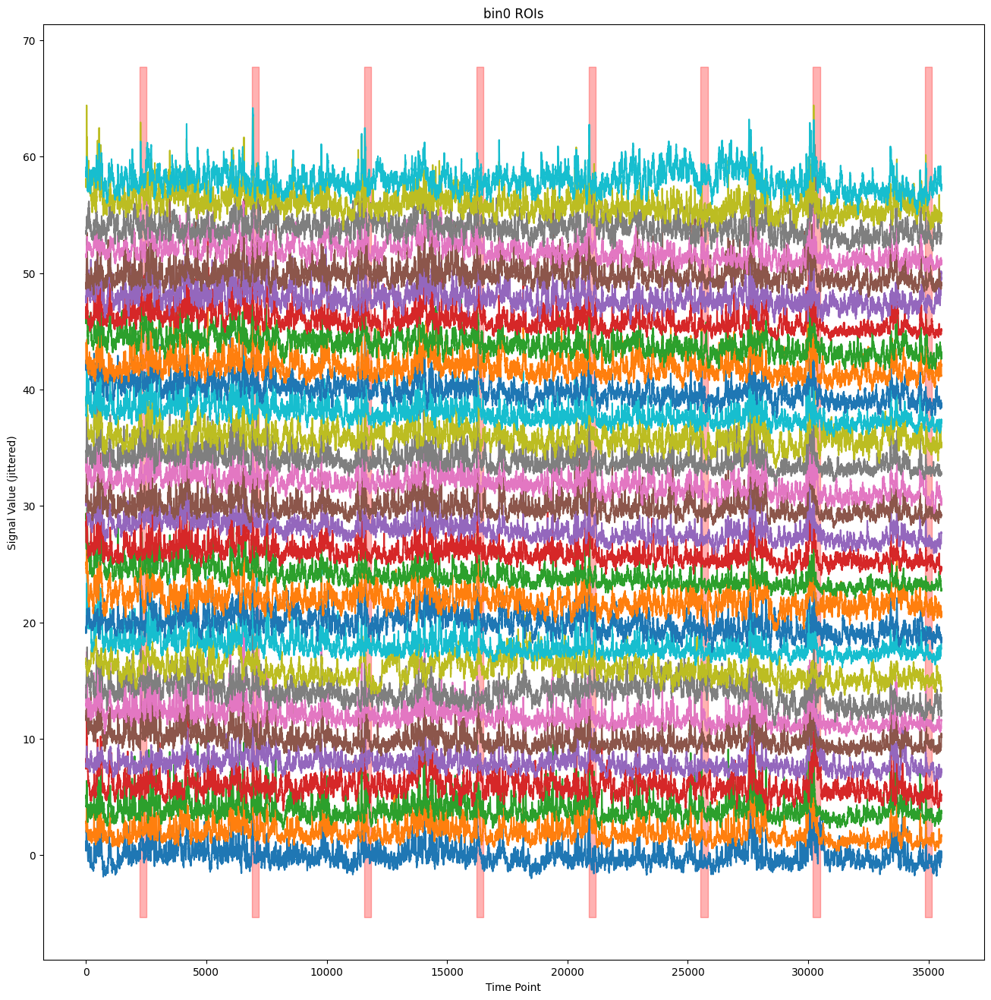

In [108]:
fig,ax = plt.subplots(figsize=(16, 16))
bin_index = 10
# Plot each signal with a jitter on the y-axis
y_offset = 2  # Adjust the offset value as needed
sn_binx = fl_cell[model.embedding_clust == bin_index]
for i in range(30):
    ax.plot(sn_binx[i,:] + (i * y_offset), label=f'Signal {i+1}')
ax.fill_between(behav_df.index, ax.get_ylim()[0], ax.get_ylim()[1], where=odor_mask, color='red', alpha=0.3)
    
# Add labels and title
plt.xlabel('Time Point')
plt.ylabel('Signal Value (jittered)')
plt.title('bin0 ROIs')

# Optionally, add a legend
#plt.legend()

# Show the plot
plt.show()

In [109]:
# plot around odor delivery
def find_odor_start_end(behav_df):
    odor_on = behav_df[behav_df.odor > 5].index
    odor_start = [odor_on[0]]
    odor_end = []
    for i in range(len(odor_on)-1):
        if odor_on[i+1] - odor_on[i]>5:
            odor_start.append(odor_on[i+1])
            odor_end.append(odor_on[i])
    if odor_on[-1] != len(behav_df)-1:
        odor_end.append(odor_on[-1])
    return odor_start[0:len(odor_end)], odor_end
odor_start, odor_end = find_odor_start_end(behav_df)


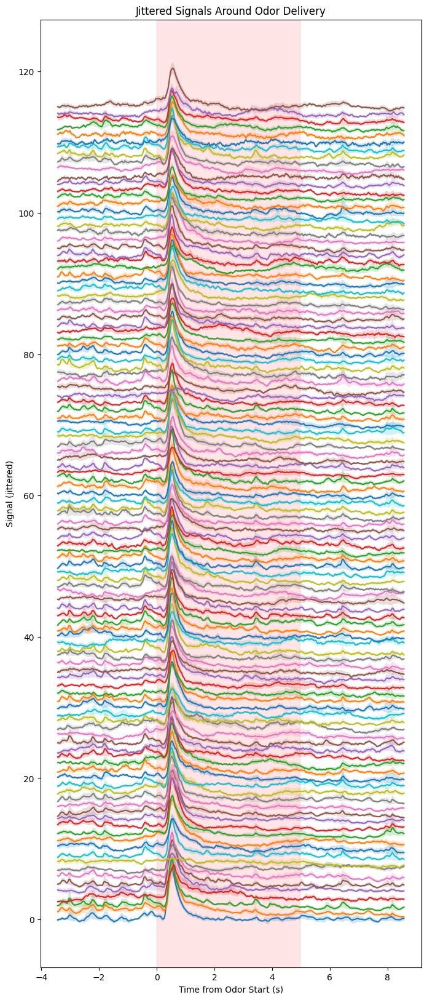

In [110]:
def plot_jittered_signals_around_odor(sn_binx, behav_df, y_jitter):
    """
    Plots all rows of sn_binx in a jittered manner on the y-axis around the odor delivery windows.

    Parameters:
    - sn_binx: 2D numpy array with dimensions (rows, time) representing signals to plot.
    - behav_df: DataFrame containing behavioral data, including time, odor_start, and odor_end.
    - y_jitter: float, the y-offset to apply between each row for clarity.
    """
    fig, ax = plt.subplots(figsize=[8,20])
    odor_start, odor_end = find_odor_start_end(behav_df)
    
    # Loop through each row in sn_binx
    for row_idx in range(sn_binx.shape[0]):
        odor_all = []
        for i in range(len(odor_start)-1):
            ind1 = odor_start[i] - 200
            ind2 = odor_start[i] + 500
            odor_all.append(sn_binx[row_idx, ind1:ind2])
        
        # Calculate mean and standard deviation for odor_all segments
        odor_mean = np.mean(np.array(odor_all), axis=0)
        odor_std = np.std(np.array(odor_all), axis=0) / np.sqrt(len(odor_all))  # Standard Error of the Mean (SEM)
        
        # Plot the mean signal for each row with y-offset
        ax.plot(behav_df.time[ind1:ind2] - behav_df.time[odor_start[i]], odor_mean + (row_idx * y_jitter), label=f'Row {row_idx}')
        
        # Optional: Add fill_between for SEM or STD
        ax.fill_between(behav_df.time[ind1:ind2] - behav_df.time[odor_start[i]],
                         odor_mean - odor_std + (row_idx * y_jitter),
                         odor_mean + odor_std + (row_idx * y_jitter), alpha=0.2)

    # Highlight the odor delivery window
    ax.axvspan(0, behav_df.time[odor_end[0]] - behav_df.time[odor_start[0]], color='red', alpha=0.1)
    
    plt.xlabel('Time from Odor Start (s)')
    plt.ylabel('Signal (jittered)')
    plt.title('Jittered Signals Around Odor Delivery')
    #plt.legend()
plot_jittered_signals_around_odor(sn_binx, behav_df, 1)

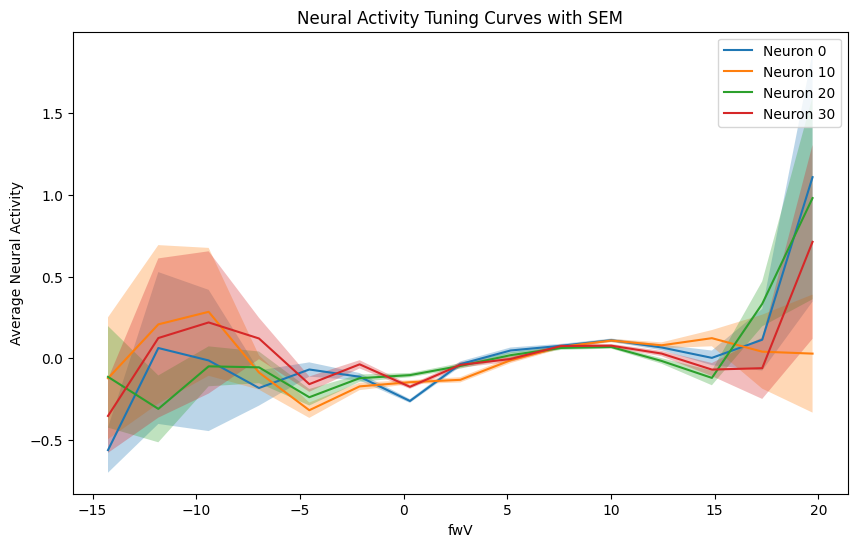

In [111]:

# Assuming neural_activity is your neurons*time_step matrix
# and behavior_variable is your behavioral variable array of length time_step

# Example data (replace these with your actual data)
neural_activity = sn_binx  # 100 neurons, 1000 time steps
behavior_variable = behav_df.fwV  # Example behavioral variable

# Select example neurons to plot
neurons_to_plot = [0, 10,20,30]  # Example indices of neurons
num_bins = 15  # Number of bins for the behavioral variable
def tuning_curve_1d(behavior_variable, neural_activity,neurons_to_plot,num_bins):
# Bin the behavioral variable
    bins = np.linspace(np.min(behavior_variable), np.max(behavior_variable), num_bins+1)
    bin_centers = 0.5 * (bins[1:] + bins[:-1])

    # Initialize a plot
    plt.figure(figsize=(10, 6))

    # Plot tuning curves with SEM for selected neurons
    for neuron_index in neurons_to_plot:
        # Bin neural activity based on the behavioral variable
        binned_activity = np.empty(num_bins)
        binned_sem = np.empty(num_bins)  # Array to store the SEM values for each bin
        
        for i in range(num_bins):
            # Find indices of behavior_variable that fall into the current bin
            indices = np.where((behavior_variable >= bins[i]) & (behavior_variable < bins[i+1]))[0]
            # Calculate the mean activity of the current neuron for these indices
            bin_data = neural_activity[neuron_index, indices]
            binned_activity[i] = np.mean(bin_data)
            # Calculate SEM for the current bin
            binned_sem[i] = sem(bin_data)
        
        # Plot mean activity
        plt.plot(bin_centers, binned_activity, label=f'Neuron {neuron_index}')
        # Add SEM shading
        plt.fill_between(bin_centers, binned_activity - binned_sem, binned_activity + binned_sem, alpha=0.3)

    # Beautifying the plot
    plt.xlabel(behavior_variable.name)
    plt.ylabel('Average Neural Activity')
    plt.legend()
    plt.title('Neural Activity Tuning Curves with SEM')
    plt.show()
tuning_curve_1d(behavior_variable, neural_activity,neurons_to_plot,num_bins)

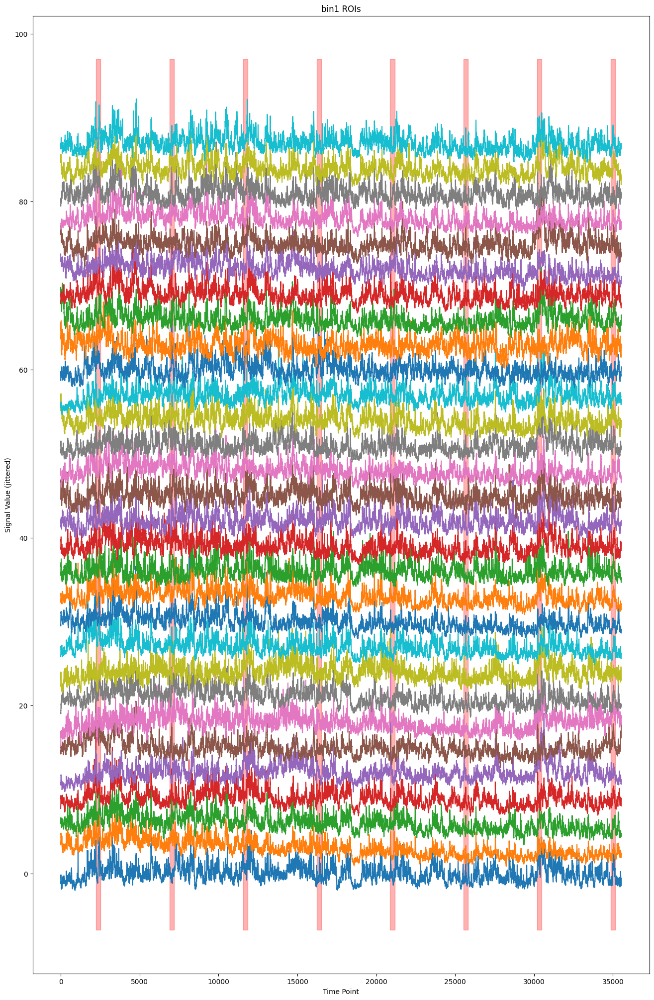

In [135]:
fig,ax = plt.subplots(figsize=(16, 25))
bin_index = 6
# Plot each signal with a jitter on the y-axis
y_offset = 3 # Adjust the offset value as needed
sn_binx = fl_cell[model.embedding_clust == bin_index]
for i in range(30):
    ax.plot(sn_binx[i,:] + (i * y_offset), label=f'Signal {i+1}')
ax.fill_between(behav_df.index, ax.get_ylim()[0], ax.get_ylim()[1], where=odor_mask, color='red', alpha=0.3)
    
# Add labels and title
plt.xlabel('Time Point')
plt.ylabel('Signal Value (jittered)')
plt.title('bin1 ROIs')

# Optionally, add a legend
#plt.legend()

# Show the plot
plt.show()

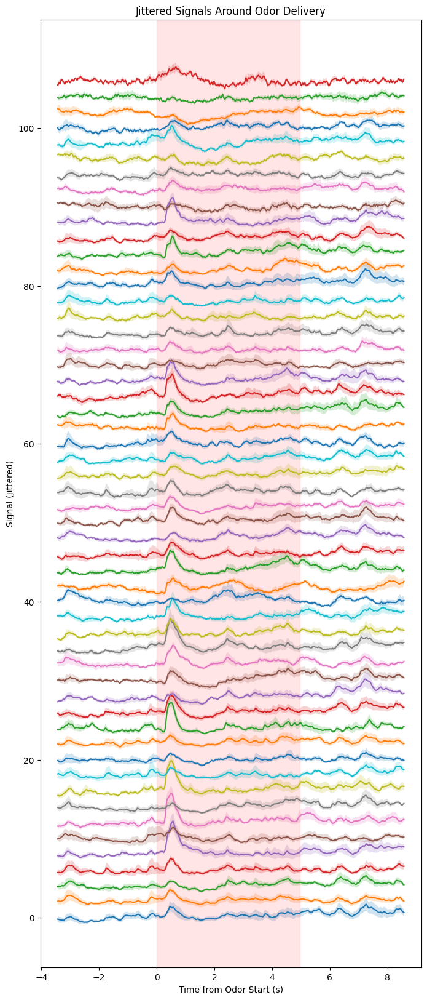

In [136]:
plot_jittered_signals_around_odor(sn_binx, behav_df, 2)

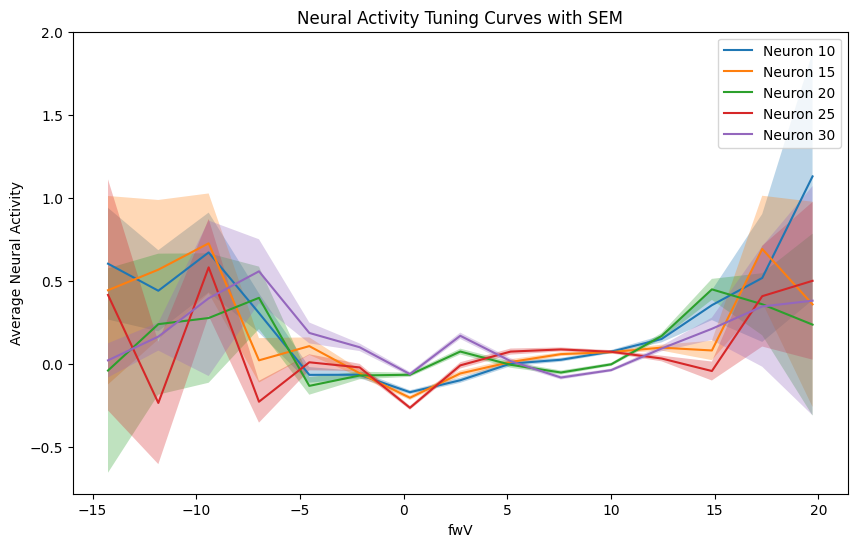

In [137]:
neural_activity = sn_binx  # 100 neurons, 1000 time steps
behavior_variable = behav_df.fwV  # Example behavioral variable

# Select example neurons to plot
neurons_to_plot = [10,15,20,25,30]  # Example indices of neurons
num_bins = 15  # Number of bins for the behavioral variable
tuning_curve_1d(behavior_variable, neural_activity,neurons_to_plot,num_bins)